In [112]:
import pymysql
import pandas as pd
import numpy as np
import seaborn as sns
from pandas import DataFrame, Series
import matplotlib.pyplot as plt
import sys
from datetime import datetime

# plotly packages and settings
import plotly
from plotly import tools
import plotly.graph_objs as go
import cufflinks as cf
#import modules to work with data visualizations offline
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
#connect the Javascript to the notebook with the init_notebook_mode() method
# with the connected argument set to True
init_notebook_mode(connected=True)
#Update to use cufflinks offline
cf.go_offline()

pd.set_option('display.unicode.ambiguous_as_wide', True)
pd.set_option('display.unicode.east_asian_width', True)

from pyecharts import Line, Timeline, Grid,Bar,Scatter,EffectScatter
import math
from pyecharts import online

online()

import colorlover as cl
from IPython.display import HTML
import warnings
warnings.filterwarnings('ignore')

from pylab import mpl
mpl.rcParams['font.sans-serif'] = ['Fangsong'] # 指定默认字体
mpl.rcParams['axes.unicode_minus'] = False # 解决保存图像是负号'-'显示为方块的问题

In [113]:
def get_all_data(db,time_info):
    ###提取输入的数据库信息
    host=db.split(':')[0]
    port=int(db.split(':')[1].split('-')[0])
    db_name=db.split('-')[-1]
    #print(host,port,db_name)
    #打开数据库连接
    db = pymysql.connect(host = host, port = port, user = 'admin', \
                         passwd = 'Pwd@union9527', db = db_name, \
                         use_unicode=True, charset="utf8")
    #创建游标对象
    cursor = db.cursor()
    sql = 'select * from lifetest_index'
    cursor.execute(sql)
    data = cursor.fetchall()
    data = pd.DataFrame(list(data))

    sql1 = 'select * from lifetest_daily_index'
    cursor.execute(sql1)
    data_day = cursor.fetchall()
    data_day = pd.DataFrame(list(data_day))
    db.close()
    #添加列名
    data_day.columns = ['day_laser','mean_day','max_day','min_day','range_day']
    data_day['date'] = pd.to_datetime(data_day.day_laser.str.split('_').apply(lambda x:x[0]),format='%Y%m%d')
    data_day['laser_id'] = data_day.day_laser.str.split('_').apply(lambda x:x[1])
    data_day['server_id']=data_day.laser_id.apply(lambda x: '10.1.1.'+x[1:3])

    data.columns=['filename','time','duration','avg_voltage','range_voltage',
                  'avg_current','range_current', \
                  'pwm','prop_0.1','prop_0.2',\
                 'prop_0.3','prop_0.3more','avg_duration','false_crc_prop',\
                 'uncomplete_frame_prop','missing_frame_prop','mean_hour',\
                  'max_hour','min_hour',\
                 'rand_err_trimed','max_daily_variation','std','range',\
                 'measure_5','measure_10','measure_15','measure_15more',\
                 'posi_rand_err','posi_rand_err_trimed','mean_hour_real_diff',\
                 'daily_mean_variation','error_interval','label']

    data['laser_id'] = data.filename.str.split('-').apply(lambda x: x[-1]).str.split('.').apply(lambda x: x[0])
    data['date'] = data.filename.str.split('-').apply(lambda x: x[0]).str.split('/').apply(lambda x: x[-1]).str.split('_').apply(lambda x: x[0])
    data['date']=pd.to_datetime(data['date'],format='%Y%m%d.%H')
    data['date2']=data.date.apply(lambda x:x.strftime("%Y%m%d.%H"))
    data['date1'] = data['date'].apply(lambda x: x.date())
    data['server_id']=data.filename.str.split('_').apply(lambda x:x[1]).str.split('-').apply(lambda x:x[0])    
    if time_info=='ALL':
        return data,data_day
    else:
        time_start=datetime.strptime(time_info.split(',')[0]+' 00:00:00','%Y-%m-%d %H:%M:%S')
        time_end=datetime.strptime(time_info.split(',')[1]+' 23:00:00','%Y-%m-%d %H:%M:%S')
        min_time=data.date.min()
        if time_start < min_time:
            print('现有数据最早时间为：{}!'.format(min_time))
        data1 = data[(data['date']>=time_start)&(data['date']<=time_end)]
        data_day1 = data_day[(data_day['date']>=time_start)&(data_day['date']<=time_end)]    
        #data1=data1.fillna(0)#！！！有些项为空
        return data1,data_day1

In [114]:
'''
def time_slice(data,data_day,time_info):
    time_start=datetime.strptime(time_info.split(',')[0]+' 00:00:00','%Y-%m-%d %H:%M:%S')
    time_end=datetime.strptime(time_info.split(',')[1]+' 23:00:00','%Y-%m-%d %H:%M:%S')
    min_time=data.date.min()
    if time_start < min_time:
        print('现有数据最早时间为：{}!'.format(min_time))
    data1 = data[(data['date']>=time_start)&(data['date']<=time_end)]
    data_day1 = data_day[(data_day['date']>=time_start)&(data_day['date']<=time_end)]
    return data1,data_day1
''';

In [115]:
#字典内容分别为：中文名称，纵坐标单位，(阈值下界，阈值上界)
dic = {'avg_current':['平均电压','单位(V)',11,13],\
       'range_current':['电压稳定度','单位(V)',-200,200], \
       'avg_voltage':['平均电流','单位(mA)'],\
       'range_voltage':['电流稳定度','单位(mA)'],\
       'pwm':['PWM值','单位(mA)',-100,100],\
       'prop_0.1':['区间[66.5,66.7]占比','单位(%)'],\
       'prop_0.2':['区间[66.4,66.5)和(66.7,66.8]占比','单位(%)'],\
       'prop_0.3':['区间[66.3,66.5)和(66.8,66.9]占比','单位(%)'],\
       'prop_0.3more':['小于66.3ms或大于66.9ms占比','单位(%)'],\
       'max_hour':['小时最大值','单位(mm)'],\
       'min_hour':['小时最小值','单位(mm)'],\
       'avg_duration':['平均每帧用时','单位(ms)',65.66,67.66],\
       'false_crc_prop':['CRC校验错误率','单位(%)',0.01],\
       'uncomplete_frame_prop':['不完整帧占比','单位(%)',0.5],\
       'missing_frame_prop':['漏帧率','单位(%)',0.5],\
       'mean_hour':['小时平均值','单位(mm)'],\
       'rand_err_trimed':['测量值随机误差最大值','单位(mm)',-30,30],\
       'max_daily_variation':['日波动最大值','单位(mm)',-30,30],\
       'std':['测量值标准差','单位(mm)'],\
       'range':['测量值极差','单位(mm)',60],\
       'measure_5':['$\\text{区间}[\\mu-5,\\mu+5]\\text{内占比}$','单位(%)'],\
       'measure_10':['$\\text{区间}[\mu-10,\mu-5)\cup(\mu+5,\mu+10]\\text{内占比}$','单位(%)'],\
       'measure_15':['$\\text{区间}[\mu-15,\mu-10)\cup(\mu+10,\mu+15]\\text{内占比}$','单位(%)'],\
       'measure_15more':['$\\text{区间}(-\infty,\mu-15)\cup(\mu+15,+\infty]\\text{内占比}$','单位(%)'],\
       'posi_rand_err':['随机误差最大值(未去异常值)出现的角度'],\
       'posi_rand_err_trimed':['随机误差最大值(去异常值)出现的角度'],\
       'mean_hour_real_diff':['小时平均值与真实值之差','单位(mm)',-10,10],\
       'daily_mean_variation':['日均值波动','单位(mm)',10],\
       'error_interval':['产品误差区间','单位(mm)',-20,20],
       }



# 定义接口参数
para_dic={'VC':['avg_voltage','range_voltage',\
                'avg_current','range_current'],\
         'MO':['pwm','prop_0.1','prop_0.2',\
             'prop_0.3','prop_0.3more','avg_duration'],\
         'TR':['false_crc_prop',\
             'uncomplete_frame_prop','missing_frame_prop'],\
         'ST':[['mean_hour','max_hour','min_hour','mean_day','max_day','min_day'],\
              ['max_daily_variation','std','range','range_day',\
              'measure_5','measure_10','measure_15','measure_15more','posi_rand_err_trimed'],\
              ['rand_err_trimed','mean_hour_real_diff','daily_mean_variation','error_interval']]}

In [116]:
##### 单个设备动态折线图 无阈值 ##### 
def argument_plot_no_threshold(df,argu):#argu:要可视化的判据(列名)
    la = label_dic[argu]
    df_yes = df[df[la]=="0"]
    groups = df_yes.groupby('laser_id')
    d1 = groups[argu].max()
    d2 = groups[argu].min()
    d3 = groups[argu].mean(numeric_only=False)
    d_all = DataFrame([d1,d2,d3]).T
    d_all.columns = ['最大值','最小值','平均值']
    #d_all.columns = ['Max','Min','Average']
    d_all.sort_values(by='最大值',ascending=False,inplace=True)
    print(d_all)
    df1 = df_yes.loc[:,[argu,'laser_id','date']].reset_index(drop=True).sort_values(by='date')
    df2 = df1.pivot(index='date',columns='laser_id',values=argu)
    _data = df2.iplot(kind='scatter',mode='lines+markers',size=4,opacity=0.5,
              title=dic[argu][0],yTitle=dic[argu][1],asFigure=True)
    _data['layout']['width'] = 600
    _data['layout']['height'] = 300
    _data['layout']['margin'] = dict(t=80,b=50,l=60)
    _data.iplot()
    #return d_all

##### 单个设备动态折线图 带阈值 ##### 
def argument_plot_with_threshold(df,argu):#输入需要可视化的判据
    la = label_dic[argu]
    df_yes = df[df[la]=="0"]
    groups = df_yes.groupby('laser_id')
    d1 = groups[argu].max()
    d2 = groups[argu].min()
    d3 = groups[argu].mean(numeric_only=False)
    d_all = DataFrame([d1,d2,d3]).T
    d_all.columns = ['最大值','最小值','平均值']
    #d_all.columns = ['Max','Min','Average']
    d_all.sort_values(by='最大值',ascending=False,inplace=True)
    print(d_all)
    df1 = df_yes.loc[:,[argu,'laser_id','date']].reset_index(drop=True).sort_values(by='date')
    df2 = df1.pivot(index='date',columns='laser_id',values=argu)
    _data = df2.iplot(kind='scatter',mode='lines+markers',size=4,opacity=0.5,
              title=dic[argu][0],yTitle=dic[argu][1],asFigure=True)
    _data['layout']['width'] = 600
    _data['layout']['height'] = 300
    _data['layout']['margin'] = dict(t=80,b=50,l=60)
    _data['layout']['shapes'] = [{'type':'line',
                                'x0':df2.index[0],
                                'y0':dic[argu][2],
                                'x1':df2.index[-1],
                                'y1':dic[argu][2],
                                'line':{'color': 'rgb(50, 171, 96)',
                                'width': 2,
                                'dash':'dashdot'      },
                                 },
                                {'type':'line',
                                'x0':df2.index[0],
                                'y0':dic[argu][3],
                                'x1':df2.index[-1],
                                'y1':dic[argu][3],
                                'line':{'color': 'rgb(50, 171, 96)',
                                'width': 2,
                                'dash':'dashdot'      },
                                 }]
    _data.iplot()
    return d_all

##### 按照串口分组的折线图 #####
def server_line_plot(df,col,server):
    la = label_dic[col]
    data = df[df[la]=="0"]
    num_server=len(server)
    subplot_title = ['串口'+ser for ser in server]
    row=int(np.ceil(num_server/2))
    fig = tools.make_subplots(rows=row, cols=2, print_grid=False,\
                              shared_xaxes=True,subplot_titles=subplot_title)
    i=2
    j=1
    for ser in server:
        p=i//2;q=(j+1)%2+1
        df = data[data['server_id']==ser]
        df1 = df.loc[:,[col,'laser_id','date']].reset_index(drop=True).sort_values(by='date')
        df2 = df1.pivot(index='date',columns='laser_id',values=col)
        for co in df2.columns:
            fig.append_trace({'x':df2.index,
                             'y':df2[co],
                             'type':'scatter',
                              'mode':'lines+markers',
                             'name':co},p,q)
        i+=1
        j+=1 
    fig['layout']['width']=800
    fig['layout']['height']=300*row
    fig['layout']['title']=dic[col][0]
    fig['layout']['yaxis']=dict(title=dic[col][1])
    iplot(fig)


##### 占比面积图 按设备分 #####
def prop_with_subplot(data,col,col_list,name):
    subplot_title = ['设备'+la for la in laser_list]
    fig = tools.make_subplots(rows=int(np.ceil(num_laser/2)), cols=2, \
                              vertical_spacing = 0.1,print_grid=False,
                              shared_xaxes=True,\
                              subplot_titles=subplot_title)
    i=2
    j=1
    color =['rgb(184, 247, 212)','rgb(111, 231, 219)','rgb(127, 166, 238)','rgb(131, 90, 241)']
    legend_group = ['group0','group1','group2','group3']
    yaxis = ['yaxis'+str(i) for i in range(1,len(laser_list)+1)]
    s=0
    for la in laser_list:
        p=i//2;q=(j+1)%2+1
        df = data[data['laser_id']==la]
        data_test = df.loc[:,['laser_id','prop_0.1','prop_0.2','prop_0.3','prop_0.3more','date']]
        #data_test['date'] = data_test.date.apply(lambda x: x.strftime('%m%d.%H'))
        #data_test['date'] = pd.to_datetime(data_test['date'],format='%m%d%Y.%H')
        if (p==1)&(q==1):
            for k in range(4):
                trace=go.Scatter(
                x=data_test['date'],
                y=data_test[col_list[k]], 
                name=name[k],
                legendgroup=legend_group[k],
                showlegend=True,
                mode='lines',
                line=dict(width=0.5,
                color=color[k]),
                stackgroup='one',
                )
                fig.append_trace(trace,p,q)
        else:
            for k in range(4):
                trace=go.Scatter(
                x=data_test['date'],
                y=data_test[col_list[k]], 
                name=name[k],
                legendgroup=legend_group[k],
                showlegend=False,
                mode='lines',
                line=dict(width=0.5,
                color=color[k]),
                stackgroup='one',
                )
                fig.append_trace(trace,p,q) 
        fig['layout'][yaxis[s]].update(ticksuffix='%')
        i+=1
        j+=1 
        s+=1
    fig['layout']['width']=800
    fig['layout']['height']=600
    fig['layout']['title']=col
    iplot(fig)

###### 测量值分布图 ######
def get_measure_data(data,col):
    df = data[col].str.split(' ',expand=True)
    df.columns=angle1
    df['laser_id']=data['laser_id']
    df['date']=data['date'].apply(lambda x:x.strftime(format='%m%d.%H'))
    df['server_id']=data['server_id']
    return df


def get_angle_df(measure5,measure10,measure15,measure15more,angle):
    s1 = measure5[angle]
    s1.name='measure_5'
    s2 = measure10[angle]
    s2.name='measure_10'
    s3 = measure15[angle]
    s3.name='measure_15'
    s4 = measure15more[angle]
    s4.name='measure_15more'
    s5 = measure5['laser_id']
    s6 = measure5['date']
    s7 = measure5['server_id']
    df = pd.concat([s1,s2,s3,s4,s5,s6,s7],axis=1)
    return df

def prop_with_subplot_measure(data,la,col_list,name):
    da = data[data['laser_id']==la]
    subplot_title = ['角度'+str(an) for an in angle_list]
    fig = tools.make_subplots(rows=1, cols=4, \
                              horizontal_spacing = 0.1,print_grid=False,
                              shared_yaxes=True,\
                              subplot_titles=subplot_title)
    i=1
    j=1
    color =['rgb(184, 247, 212)','rgb(111, 231, 219)','rgb(127, 166, 238)','rgb(131, 90, 241)']
    legend_group = ['group0','group1','group2','group3']
    yaxis = ['yaxis'+str(i) for i in range(1,len(angle_list)+1)]
    s=0
    for an in angle_list:
        data_test = get_angle_df(an)
        if (i==1)&(j==1):
            for k in range(4):
                trace=go.Scatter(
                x=data_test['date'],
                y=data_test[col_list[k]], 
                name=name[k],
                legendgroup=legend_group[k],
                showlegend=True,
                mode='lines',
                line=dict(width=0.5,
                color=color[k]),
                stackgroup='one',
                )
                fig.append_trace(trace,i,j)
        else:
            for k in range(4):
                trace=go.Scatter(
                x=data_test['date'],
                y=data_test[col_list[k]], 
                name=name[k],
                legendgroup=legend_group[k],
                showlegend=False,
                mode='lines',
                line=dict(width=0.5,
                color=color[k]),
                stackgroup='one',
                )
                fig.append_trace(trace,i,j) 
        fig['layout']['yaxis'].update(ticksuffix='%')
        j+=1 
        s+=1
    fig['layout']['width']=800
    fig['layout']['height']=300
    fig['layout']['title']=la
    iplot(fig)

def time_line_server(data,col):
    timeline = Timeline(is_auto_play=False,timeline_bottom=-5)
    max_ids = data['laser_id'].drop_duplicates().groupby(data['server_id']).count().max()
    server_list=data.server_id.unique()
    judge=dic[col][0]
    for ser in server_list:
        df = data.query('server_id == @ser').reset_index(drop = True).sort_values(by='date')
        #df = df.merge(time_unique,left_on='time_label',right_on='time',\
        #              how='outer').sort_values(by = 'time').reset_index(drop=True)
        line = 'line'+ser
        line=Line('串口'+ser+'的'+judge+'趋势图',dic[col][1],title_color='#FF6600',title_text_size=14)
        laser_ids = sorted(data[data.server_id==ser].laser_id.unique())
        for laser_id in laser_ids:
            df1 = df[df.laser_id==laser_id]
            line.add(laser_id,df1['date2'].tolist(),\
                     df1[col].tolist(), \
                     is_smooth=True,xaxis_rotate=30,yaxis_max='dataMax',\
                     yaxis_min ='dataMin',legend_orient='vertical',
                    legend_pos= 'right')
        if len(laser_ids)!=max_ids:
            for i in range(max_ids-len(laser_ids)):
                line.add(laser_id,df[df.laser_id==laser_ids[-1]]['date2'].tolist(),\
                         df[df.laser_id==laser_ids[-1]][col].tolist(), is_smooth=True,\
                         xaxis_rotate=30,yaxis_max='dataMax',yaxis_min ='dataMin',\
                         legend_orient='vertical',
                        legend_pos= 'right')
        grid = Grid()
        grid.add(line, grid_bottom="20%")
        timeline.add(grid, ser)
    return timeline 

judges=['帧用时分布','测量值分布']
def time_line_laser(data,judge,name,col_list):
    timeline = Timeline(is_auto_play=False,timeline_bottom=-5)
    laser_list1 = data.laser_id.unique()
    for la in laser_list1:
        df = data.query('laser_id == @la').reset_index(drop = True).sort_values(by='date')
        line = 'line'+la
        line=Line('设备'+la+'的'+judge+'比例面积图','单位：%',title_color='#FF6600',title_text_size=14)
        for i in range(len(col_list)):
            line.add(name[i],df['date2'].tolist(),\
                    df[col_list[i]].tolist(), \
                    is_fill=True,
                    is_stack=True,
                    line_opacity=0.2,
                    area_opacity=0.4,
                    is_smooth=True,xaxis_rotate=30,yaxis_max=100,\
                    yaxis_min =0,legend_orient='vertical',
                    legend_pos= 'right')
        grid = Grid()
        grid.add(line, grid_bottom="20%")
        timeline.add(grid, la)
    return timeline 

def mean_max_min_line(data1_today_91_mean,data1_today_91_max,data1_today_91_min,judge):#judge=['小时'，'历史趋势图']
    timeline = Timeline(timeline_bottom=-5,width=1000,height=900)
    angles = np.arange(-45,225,45)
    laser_list1=data1_today_91_mean.laser_id.unique()
    for laser_id in laser_list1:
        kk=0
        df_mean = data1_today_91_mean.query('laser_id == @laser_id').reset_index(drop = True).sort_values(by='date')
        df_max = data1_today_91_max.query('laser_id == @laser_id').reset_index(drop = True).sort_values(by='date')
        df_min = data1_today_91_min.query('laser_id == @laser_id').reset_index(drop = True).sort_values(by='date')
        grid1 = Grid(height=900,width=1000)
        for angle in angles:
            kk+=1
            line = 'line'+laser_id+str(angle)
            if kk==1:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge[0]+'最大、最小、平均值'+judge[1],"单位(mm)",title_color='#FF6600',title_text_size=14,title_pos='0%')
            elif kk==2:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge[0]+'最大、最小、平均值'+judge[1],"单位(mm)",title_color='#FF6600',title_text_size=14,title_pos='47%')
            elif kk==3:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge[0]+'最大、最小、平均值'+judge[1],"单位(mm)",title_color='#FF6600',title_text_size=14,title_top='34%',title_pos='0%')
            elif kk==4:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge[0]+'最大、最小、平均值'+judge[1],"单位(mm)",title_color='#FF6600',title_text_size=14,title_pos='47%',title_top='34%')
            elif kk==5:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge[0]+'最大、最小、平均值'+judge[1],"单位(mm)",title_color='#FF6600',title_text_size=14,title_pos='0%',title_top='65%')
            elif kk==6:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge[0]+'最大、最小、平均值'+judge[1],"单位(mm)",title_color='#FF6600',title_text_size=14,title_pos='47%',title_top='65%')
            line.add('平均值',df_mean['date'].tolist(),df_mean[angle].tolist(), is_smooth=True,xaxis_rotate=30,yaxis_max='dataMax',yaxis_min ='dataMin',legend_orient='vertical',
                            legend_pos= 'right')
            line.add('最大值',df_mean['date'].tolist(),df_max[angle].tolist(), is_smooth=True,xaxis_rotate=30,yaxis_max='dataMax',yaxis_min ='dataMin',legend_orient='vertical',
                            legend_pos= 'right',line_type ='dashed')
            line.add('最小值',df_mean['date'].tolist(),df_min[angle].tolist(), is_smooth=True,xaxis_rotate=30,yaxis_max='dataMax',yaxis_min ='dataMin',legend_orient='vertical',
                            legend_pos= 'right',line_type ='dotted')
            if kk==1:
                grid1.add(line,grid_left='5%',grid_bottom='70%',grid_right='55%')
            elif kk==2:
                grid1.add(line,grid_bottom='70%',grid_left='50%')
            elif kk==3:
                grid1.add(line,grid_left='5%',grid_top='39%',grid_right='55%',grid_bottom='38%')
            elif kk==4:
                grid1.add(line,grid_top='39%',grid_left='50%',grid_bottom='38%')
            elif kk==5:
                grid1.add(line,grid_left='5%',grid_top='70%',grid_right='55%',grid_bottom='7%')
            elif kk==6:
                grid1.add(line,grid_top='70%',grid_left='50%',grid_bottom='7%')
        timeline.add(grid1, laser_id)
    return timeline

###### 随机误差最大值出现的角度 ######
def bar_plot(data2a):
    data2a['posi_rand_err1'] = data2a.posi_rand_err.apply(lambda x:angle1[int(x)])
    group1 = data2a.groupby('laser_id')
    n = len(group1)//2
    fig,axes=plt.subplots(n,2, figsize=(12,3*n))
    i=0
    j=0
    for la, gro in group1:
        p=i//2;q=(j+2)%2
        gro['posi_rand_err1'].value_counts().plot.bar(ax=axes[p,q])
        axes[p,q].set_title('Laser ID:{}'.format(la),y=1.09)
        i += 1
        j += 1        
    plt.subplots_adjust(bottom=.05, top=.95, hspace=.5)
    plt.suptitle('随机误差最大值出现的角度统计图')
    plt.show()


def polar(data, col):
    la = label_dic[col]
    data = data[data[la]=="0"]
    df = data[col].str.split(' ', expand=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    df['laser_id'] = data['laser_id']
    group = df.groupby('laser_id')
    n = len(group)//2
    fig,axes=plt.subplots(n,2, subplot_kw=dict(polar=True), figsize=(10,4*n))
    i=0
    j=0
    for la, gro in group:
        num = group.size()[la]
        for k in range(num):
            axes[i//2,(j+2)%2].plot(angle,gro.iloc[k,:91],'b.',alpha=0.2)  
            k += 1
        axes[i//2,(j+2)%2].set_title('Laser ID:{}'.format(la),y=1.08)
        axes[i//2,(j+2)%2].set_rlabel_position(270)
        i += 1
        j += 1        
    plt.subplots_adjust(bottom=.05, top=.95, hspace=.3)
    plt.suptitle('判据:{}的极坐标图'.format(dic[col][0]),y=1,fontsize=14)

def line_plot(data,col):
    la = label_dic[col]
    data = data[data[la]=="0"]
    df = data[col].str.split(' ', expand=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    df['laser_id'] = data['laser_id']
    df['date'] = data['date']
    group = df.groupby('laser_id')
    n = len(group)//2
    fig,axes=plt.subplots(n,2, figsize=(12,3*n), sharex=True, sharey=True)
    degree = [0,90,180]#degrees to plot
    i=0
    j=0
    for la, gro in group:
        p=i//2;q=(j+2)%2
        #axes[i//2,(j+2)%2].plot(x=gro.date,y=gro.gro.iloc[:,np.where(angle1==degree[0])[0][0]],'b.-',label='0')
        axes[p,q].plot(gro.date,gro.iloc[:,np.where(angle1==degree[0])[0][0]],'b.-',linewidth=1,label='0')  
        axes[p,q].plot(gro.date,gro.iloc[:,np.where(angle1==degree[1])[0][0]],'r+-',linewidth=1,label='90')  
        axes[p,q].plot(gro.date,gro.iloc[:,np.where(angle1==degree[2])[0][0]],'g<-',linewidth=1,label='180')  
        axes[p,q].set_title('Laser ID:{}'.format(la),y=1.08)
        handles, labels = axes[p,q].get_legend_handles_labels()
        axes[p,q].grid(True,linestyle='--')
        axes[p,q].set_xticklabels(gro.date.apply(lambda x: x.strftime('%m%d.%H')),rotation=45)
        i += 1
        j += 1        
    fig.legend(handles, labels, loc='upper left')
    plt.subplots_adjust(bottom=.05, top=.95, hspace=.5)
    #plt.grid(True,linestyle='--')
    plt.suptitle('判据:{}的位置{}折线图'.format(dic[col][0],degree),y=1,fontsize=14)
    return df

def py_polar(col):
    mean_hour=get_measure_data(col)
    polar_mean = mean_hour.groupby('laser_id').first()
    #polar_mean = mean_hour.groupby('laser_id').apply(lambda x: x.sample(1))
    data_list=[]
    color=cl.scales['8']['div']['Spectral']
    index_list=polar_mean.index
    for i in range(len(index_list)):
        da =go.Scatterpolar(
            r=polar_mean.iloc[i,:91],
            theta=polar_mean.columns[:-2],
            mode='markers',
            name=index_list[i],
            marker=dict(color=color[i],opacity=0.8))
        data_list.append(da)
    layout=go.Layout(title=dic[col][0],showlegend=True)
    fig=go.Figure(data=data_list,layout=layout)
    iplot(fig)

def py_polar_hour(col):
    df = get_measure_data(data,col)
    df1 = df.groupby('laser_id').last()
    da = []
    colors=cl.scales['8']['div']['Spectral'] 
    k=0
    for idx, row in df1.iterrows():
        trace=go.Scatterpolar(
        r=row,
        theta=df1.columns[:-2],
        name=idx,
        mode='markers',
        marker = dict(color=colors[k])
        )
        da.append(trace)
        k+=1
    layout=go.Layout(title=dic[col][0])
    fig=go.Figure(data=da,layout=layout)
    iplot(fig)
    
dic_day={'mean_day':'日平均值','max_day':'日最大值','min_day':'日最小值','range_day':'日极差'}
def py_polar_daily(col):
    df = get_daily_measure_data(data_day,col)
    df1 = df.groupby('laser_id').last()
    da = []
    colors=cl.scales['8']['div']['Spectral'] 
    k=0
    for idx, row in df1.iterrows():
        trace=go.Scatterpolar(
        r=row,
        theta=df1.columns[:-2],
        name=idx,
        mode='markers',
        marker = dict(color=colors[k])
        )
        da.append(trace)
        k+=1
    layout=go.Layout(title=dic_day[col])
    fig=go.Figure(data=da,layout=layout)
    iplot(fig)

def get_daily_measure_data(data,col):
    df = data[col].str.split(' ',expand=True)
    df.columns=angle1
    df['laser_id']=data['laser_id']
    df['date']=data['date'].apply(lambda x: x.strftime('%m-%d'))
    return df

angle_list=np.arange(-45,225,45)
def time_line_laser_multi_angle(data,col):
    timeline = Timeline(is_auto_play=False,timeline_bottom=-5)
    judge=dic[col][0]
    da = get_measure_data(data,col)
    laser_list1=data.laser_id.unique()
    for la in laser_list1:
        df = da.query('laser_id == @la').reset_index(drop = True).sort_values(by='date')
        line = 'line'+la
        line=Line('设备'+la+'的'+judge+'多角度折线图','单位：{}'.format(dic[col][1]),title_color='#FF6600',title_text_size=14)
        for i in range(len(angle_list)):
            line.add(str(angle_list[i])+'°',df['date'].tolist(),\
                    df[angle_list[i]].tolist(), \
                    #is_symbol_show=True,
                    line_opacity=0.7,\
                    is_smooth=True,xaxis_rotate=30,yaxis_max='dataMax',\
                    yaxis_min ='dataMin',is_legend_show=True,legend_orient='vertical',
                    legend_pos= 'right')
        grid = Grid()
        grid.add(line, grid_bottom="20%")
        timeline.add(grid, la)
    return(timeline)

def time_area_measure_multi_angle(data,measure_5,measure_10,measure_15,measure_15more,judge):#judge=['小时'，'历史趋势图']
    timeline = Timeline(is_auto_play=False,timeline_bottom=-5,width=1000,height=900)
    angles = np.arange(-45,225,45)
    laser_list1=data.laser_id.unique()
    for laser_id in laser_list1:
        kk=0
        df_5 = measure_5.query('laser_id == @laser_id').reset_index(drop = True).sort_values(by='date')
        df_10 = measure_10.query('laser_id == @laser_id').reset_index(drop = True).sort_values(by='date')
        df_15 = measure_15.query('laser_id == @laser_id').reset_index(drop = True).sort_values(by='date')
        df_15more = measure_15more.query('laser_id == @laser_id').reset_index(drop = True).sort_values(by='date')
        grid1 = Grid(height=900,width=1000)
        for angle in angles:
            df=get_angle_df(df_5,df_10,df_15,df_15more,angle)
            kk+=1
            line = 'line'+laser_id+str(angle)
            if kk==1:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge,"单位(%)",title_color='#FF6600',title_text_size=14,title_pos='0%')
            elif kk==2:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge,"单位(%)",title_color='#FF6600',title_text_size=14,title_pos='47%')
            elif kk==3:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge,"单位(%)",title_color='#FF6600',title_text_size=14,title_top='34%',title_pos='0%')
            elif kk==4:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge,"单位(%)",title_color='#FF6600',title_text_size=14,title_pos='47%',title_top='34%')
            elif kk==5:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge,"单位(%)",title_color='#FF6600',title_text_size=14,title_pos='0%',title_top='65%')
            elif kk==6:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge,"单位(%)",title_color='#FF6600',title_text_size=14,title_pos='47%',title_top='65%')
            line.add('区间[u-5,u+5]',df['date'].tolist(),df['measure_5'].tolist(), is_smooth=True,is_fill=True,\
                     is_stack=True,line_opacity=0.2,\
                    area_opacity=0.4,xaxis_rotate=30,yaxis_max=100,yaxis_min =0,legend_orient='vertical',\
                            legend_pos= 'right')
            line.add('区间[u-10,u-5)U(u+5,u+10]',df['date'].tolist(),df['measure_10'].tolist(), is_smooth=True,\
                     is_fill=True,is_stack=True,line_opacity=0.2,\
                    area_opacity=0.4,xaxis_rotate=30,yaxis_max=100,yaxis_min =0,legend_orient='vertical',\
                            legend_pos= 'right')
            line.add('区间[u-15,u-10)U(u+10,u+15]',df['date'].tolist(),df['measure_15'].tolist(), is_smooth=True,is_fill=True,\
                     is_stack=True,line_opacity=0.2,\
                    area_opacity=0.4,xaxis_rotate=30,yaxis_max=100,yaxis_min =0,legend_orient='vertical',legend_pos= 'right')
            line.add('小于u-15或大于u+15',df['date'].tolist(),df['measure_15more'].tolist(), is_smooth=True,is_fill=True,\
                     is_stack=True,line_opacity=0.2,\
                    area_opacity=0.4,xaxis_rotate=30,yaxis_max=100,yaxis_min =0,legend_orient='vertical',legend_pos= 'right')
            if kk==1:
                grid1.add(line,grid_left='5%',grid_bottom='70%',grid_right='55%')
            elif kk==2:
                grid1.add(line,grid_bottom='70%',grid_left='50%')
            elif kk==3:
                grid1.add(line,grid_left='5%',grid_top='39%',grid_right='55%',grid_bottom='38%')
            elif kk==4:
                grid1.add(line,grid_top='39%',grid_left='50%',grid_bottom='38%')
            elif kk==5:
                grid1.add(line,grid_left='5%',grid_top='70%',grid_right='55%',grid_bottom='7%')
            elif kk==6:
                grid1.add(line,grid_top='70%',grid_left='50%',grid_bottom='7%')
        timeline.add(grid1, laser_id)
    return timeline

def time_area_error_multi_angle(data,judge):#judge=['小时'，'历史趋势图']
    df_error=data.error_interval.str.split('],',expand=True)
    df_error=df_error.applymap(lambda x: x.split('[')[-1])
    #分出上下界
    df_error_upper=df_error.applymap(lambda x: x.split(',')[1])
    df_error_lower=df_error.applymap(lambda x: x.split(',')[0])
    #定义列
    df_error_upper.columns=angle1
    df_error_lower.columns=angle1
    df_error_upper['laser_id']=data['laser_id']
    df_error_upper['date']=data['date']
    df_error_upper.sort_values(by='date',inplace=True)
    df_error_upper['date']=data['date'].apply(lambda x: x.strftime(format='%m%d.%H'))
    df_error_lower['laser_id']=data['laser_id']
    df_error_lower['date']=data['date']
    df_error_lower.sort_values(by='date',inplace=True)
    df_error_lower['date']=data['date'].apply(lambda x: x.strftime(format='%m%d.%H'))
    #合并函数
    df1=df_error_upper.copy()
    df2=df_error_lower.copy()
    timeline = Timeline(is_auto_play=False,timeline_bottom=-5,width=1000,height=900)
    angles = np.arange(-45,225,45)
    laser_list1=data.laser_id.unique()
    for laser_id in laser_list1:
        kk=0
        df_u = df1.query('laser_id == @laser_id').reset_index(drop = True).sort_values(by='date')
        df_l = df2.query('laser_id == @laser_id').reset_index(drop = True).sort_values(by='date')
        grid1 = Grid(height=900,width=1000)
        for angle in angles:
            kk+=1
            line = 'line'+laser_id+str(angle)
            if kk==1:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge,"单位(mm)",title_color='#FF6600',title_text_size=14,title_pos='0%')
            elif kk==2:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge,"单位(mm)",title_color='#FF6600',title_text_size=14,title_pos='47%')
            elif kk==3:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge,"单位(mm)",title_color='#FF6600',title_text_size=14,title_top='34%',title_pos='0%')
            elif kk==4:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge,"单位(mm)",title_color='#FF6600',title_text_size=14,title_pos='47%',title_top='34%')
            elif kk==5:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge,"单位(mm)",title_color='#FF6600',title_text_size=14,title_pos='0%',title_top='65%')
            elif kk==6:
                line=Line('设备'+laser_id+'的'+str(angle)+'度的'+judge,"单位(mm)",title_color='#FF6600',title_text_size=14,title_pos='47%',title_top='65%')
            line.add('误差上界',df_u['date'].tolist(),df_u[angle].tolist(), is_smooth=True,is_fill=False,\
                     is_stack=False,line_opacity=0.2,\
                    area_opacity=0.4,xaxis_rotate=30,yaxis_max='dataMax',yaxis_min ='dataMin',legend_orient='vertical',\
                            legend_pos= 'right')
            line.add('误差下界',df_l['date'].tolist(),df_l[angle].tolist(), is_smooth=True,\
                     is_fill=True,is_stack=False,line_opacity=0.2,\
                    area_opacity=0.4,xaxis_rotate=30,yaxis_max='dataMax',yaxis_min ='dataMin',legend_orient='vertical',\
                            legend_pos= 'right')
            if kk==1:
                grid1.add(line,grid_left='5%',grid_bottom='70%',grid_right='55%')
            elif kk==2:
                grid1.add(line,grid_bottom='70%',grid_left='50%')
            elif kk==3:
                grid1.add(line,grid_left='5%',grid_top='39%',grid_right='55%',grid_bottom='38%')
            elif kk==4:
                grid1.add(line,grid_top='39%',grid_left='50%',grid_bottom='38%')
            elif kk==5:
                grid1.add(line,grid_left='5%',grid_top='70%',grid_right='55%',grid_bottom='7%')
            elif kk==6:
                grid1.add(line,grid_top='70%',grid_left='50%',grid_bottom='7%')
        timeline.add(grid1, laser_id)
    return timeline

def py_polar_hour(data,col):
    df = get_measure_data(data,col)
    df1 = df.groupby('laser_id').last()
    da = []
    colors=cl.scales['8']['div']['Spectral'] 
    k=0
    for idx, row in df1.iterrows():
        trace=go.Scatterpolar(
        r=row,
        theta=df1.columns[:-2],
        name=idx,
        mode='markers',
        marker = dict(color=colors[k])
        )
        da.append(trace)
        k+=1
    layout=go.Layout(title=dic[col][0])
    fig=go.Figure(data=da,layout=layout)
    iplot(fig)

def polar1(data, col):
    la = label_dic[col]
    data = data[data[la]=="0"]
    df = data[col].str.split(' ', expand=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    df['laser_id'] = data['laser_id']    
    if df.laser_id.nunique()==1:
        laser_name = df.laser_id.unique()[0]
        fig,ax=plt.subplots(figsize=(10,6))
        #ax.patch.set_visible(False)
        ax.axis('off')
        for idx,row in df.iterrows():
            plt.polar(angle,row[:91],'b.',alpha=0.2)
            plt.title('设备{}的{}极坐标图'.format(laser_name,dic[col][0]),fontsize=14,color='red')  
    elif df.laser_id.nunique()==2:
        group = df.groupby('laser_id')
        fig,axes=plt.subplots(1,2, subplot_kw=dict(polar=True), figsize=(10,4))
        i=0
        for la, gro in group:
            num = group.size()[la]
            for k in range(num):
                axes[i].plot(angle,gro.iloc[k,:91],'b.',alpha=0.2)  
                k += 1
            axes[i].set_title('Laser ID:{}'.format(la),y=1.08)
            axes[i].set_rlabel_position(270)
            i += 1     
        plt.subplots_adjust(bottom=.05, hspace=.3)
        plt.suptitle('判据:{}的极坐标图'.format(dic[col][0]),color='red',y=1.06,fontsize=18)
    elif (df.laser_id.nunique()>2)&(df.laser_id.nunique()%2==0):
        group = df.groupby('laser_id')
        n = len(group)//2
        fig,axes=plt.subplots(n,2, subplot_kw=dict(polar=True), figsize=(10,4*n))
        i=0
        j=0
        for la, gro in group:
            num = group.size()[la]
            #print(i//2,(j+2)%2)
            
            for k in range(num):
                axes[i//2,(j+2)%2].plot(angle,gro.iloc[k,:91],'b.',alpha=0.2)  
                k += 1
            axes[i//2,(j+2)%2].set_title('Laser ID:{}'.format(la),y=1.08)
            axes[i//2,(j+2)%2].set_rlabel_position(270)    
            i += 1
            j += 1        
        plt.subplots_adjust(bottom=.05, hspace=.3)
        plt.suptitle('判据:{}的极坐标图'.format(dic[col][0]),color='red',y=1.06,fontsize=18)
    else:
        group = df.groupby('laser_id')
        n = len(group)//2+1
        fig,axes=plt.subplots(n,2, subplot_kw=dict(polar=True), figsize=(10,4*n))
        i=0
        j=0
        for la, gro in group:
            num = group.size()[la]
            #print(i//2,(j+2)%2)
            for k in range(num):
                axes[i//2,(j+2)%2].plot(angle,gro.iloc[k,:91],'b.',alpha=0.2)  
                k += 1
            axes[i//2,(j+2)%2].set_title('Laser ID:{}'.format(la),y=1.08)
            axes[i//2,(j+2)%2].set_rlabel_position(270)
            i += 1
            j += 1        
        plt.subplots_adjust(bottom=.05, hspace=.3)
        plt.suptitle('判据:{}的极坐标图'.format(dic[col][0]),color='red',y=1.06,fontsize=18)
    #return df

def bar_plot1(data2a):
    data2a['posi_rand_err1'] = data2a.posi_rand_err.apply(lambda x:angle1[int(x)])
    if data2a.laser_id.nunique()==1:
        laser_name=data2a.laser_id.unique()[0]
        fig,ax=plt.subplots(figsize=(8,4))
        data2a['posi_rand_err1'].value_counts().plot.bar(ax=ax)
        plt.title('设备{}随机误差最大值出现的角度统计图'.format(laser_name),color='#00008B',fontsize=16)
    elif data2a.laser_id.nunique()==2:
        group1 = data2a.groupby('laser_id')
        fig,axes=plt.subplots(1,2, figsize=(12,3))
        i=0
        for la, gro in group1:
            gro['posi_rand_err1'].value_counts().plot.bar(ax=axes[i])
            axes[i].set_title('Laser ID:{}'.format(la),y=1.05)
            i += 1 
        plt.subplots_adjust(bottom=.05, hspace=.5)
        plt.suptitle('随机误差最大值出现的角度统计图',color='#00008B',fontsize=18,y=1.03)
    elif (data2a.laser_id.nunique()>2)&(data2a.laser_id.nunique()%2==0):
        group1 = data2a.groupby('laser_id')
        n = len(group1)//2
        fig,axes=plt.subplots(n,2, figsize=(12,3*n))
        i=0
        j=0
        for la, gro in group1:
            p=i//2;q=(j+2)%2
            gro['posi_rand_err1'].value_counts().plot.bar(ax=axes[p,q])
            axes[p,q].set_title('Laser ID:{}'.format(la),y=1.05)
            i += 1
            j += 1        
        plt.subplots_adjust(bottom=.05, hspace=.5)
        plt.suptitle('随机误差最大值出现的角度统计图',color='#00008B',fontsize=18,y=1.03)
    else:    
        group1 = data2a.groupby('laser_id')
        n = len(group1)//2+1
        fig,axes=plt.subplots(n,2, figsize=(12,3*n))
        i=0
        j=0
        for la, gro in group1:
            p=i//2;q=(j+2)%2
            gro['posi_rand_err1'].value_counts().plot.bar(ax=axes[p,q])
            axes[p,q].set_title('Laser ID:{}'.format(la),y=1.05)
            i += 1
            j += 1        
        plt.subplots_adjust(bottom=.05, hspace=.5)
        plt.suptitle('随机误差最大值出现的角度统计图',color='#00008B',fontsize=18,y=1.03)
        plt.show()

In [117]:
def result_VC(data,analyze_object):
    print("\033[1;31m\t{}\033[0m\n".format('电压电流特性：'))
    if analyze_object=='ALL':
        for argu in para_dic['VC']:
            argument_plot_no_threshold(data,argu)
    elif 'L' in analyze_object:
        laser_input=analyze_object.split(',')[1:]
        df=data[data['laser_id'].isin(laser_input)]
        for argu in para_dic['VC']:
            argument_plot_no_threshold(df,argu)  
    else:
        server_input=analyze_object.split(',')[1:]
        df=data[data['server_id'].isin(server_input)]
        for argu in para_dic['VC']:
            server_line_plot(df,argu,server_input)

def result_MO(data,analyze_object):
    print("\033[1;31m\t{}\033[0m".format('电机特性：'))
    if analyze_object=='ALL':
        argument_plot_no_threshold(data,'pwm')
        argument_plot_no_threshold(data,'avg_duration')
        time_line_MO=time_line_laser(data,'帧用时分布',name1,col_list1)
    elif 'L' in analyze_object:
        laser_input=analyze_object.split(',')[1:]
        df=data[data['laser_id'].isin(laser_input)]
        argument_plot_no_threshold(df,'pwm')
        argument_plot_no_threshold(df,'avg_duration')
        time_line_MO=time_line_laser(df,'帧用时分布',name1,col_list1)
    else:
        server_input=analyze_object.split(',')[1:]
        df=data[data['server_id'].isin(server_input)]
        server_line_plot(df,'pwm',server_input)
        server_line_plot(df,'avg_duration',server_input)
        time_line_MO=time_line_laser(df,'帧用时分布',name1,col_list1)
        #time_line_MO.render()
    #a,b,c,d,e,f,g,h=''
    return time_line_MO#,a,b,c,d,e,f,g,h

def result_TR(data,analyze_object):
    print("\033[1;31m\t{}\033[0m".format('传输接口特性：'))
    if analyze_object=='ALL':
        for argu in para_dic['TR']:
            argument_plot_no_threshold(data,argu)
    elif 'L' in analyze_object:
        laser_input=analyze_object.split(',')[1:]
        df=data[data['laser_id'].isin(laser_input)]
        for argu in para_dic['TR']:
            argument_plot_no_threshold(df,argu)  
    else:
        server_input=analyze_object.split(',')[1:]
        df=data[data['server_id'].isin(server_input)]
        for argu in para_dic['TR']:
            server_line_plot(df,argu,server_input)   

def result_ST(data,analyze_object):
    print("\033[1;31m\t{}\033[0m".format('统计特性：'))
    if analyze_object=='ALL':
        #print("\033[1;31m\t{}\033[0m".format('产品趋势性指标：'))
        #小时均值最大最小值
        mean_hour = get_measure_data(data,'mean_hour')
        max_hour = get_measure_data(data,'max_hour')
        min_hour = get_measure_data(data,'min_hour')
        #mean_max_min_line(mean_hour,max_hour,min_hour,judge=['小时','小时历史趋势图'])
        timeline_hour=mean_max_min_line(mean_hour,max_hour,min_hour,judge=['小时','小时历史趋势图'])

        py_polar_hour(data,'mean_hour')
        #日均值最大最小值

        mean_day = get_daily_measure_data(data_day,'mean_day')
        max_day = get_daily_measure_data(data_day,'max_day')
        min_day = get_daily_measure_data(data_day,'min_day')
        timeline_day = mean_max_min_line(mean_day,max_day,min_day,['日','历史趋势图'])

        #print("\033[1;31m\t{}\033[0m".format('产品离散度指标：'))
        #polar(data,'max_daily_variation')
        #time_line_laser_multi_angle(data,'max_daily_variation')

        timeline_max_daily_variation=time_line_laser_multi_angle(data,'max_daily_variation')
        polar(data,'std')
        #time_line_laser_multi_angle(data,'std')

        timeline_std=time_line_laser_multi_angle(data,'std')
        measure_5 = get_measure_data(data,'measure_5')
        measure_10 = get_measure_data(data,'measure_10')
        measure_15 = get_measure_data(data,'measure_15')
        measure_15more = get_measure_data(data,'measure_15more')
        #time_area_measure_multi_angle(data,measure_5,measure_10,measure_15,measure_15more,judge='测量值分布图')#judge=['小时'，'历史趋势图']

        timeline_measure=time_area_measure_multi_angle(data,measure_5,measure_10,measure_15,measure_15more,judge='测量值分布图')#judge=['小时'，'历史趋势图']           
        bar_plot1(data)
        #print("\033[1;31m\t{}\033[0m".format('产品误差指标：'))
        #polar(data,'rand_err_trimed')
        #time_line_laser_multi_angle(data,'rand_err_trimed')

        timeline_rand = time_line_laser_multi_angle(data,'rand_err_trimed')
        polar(data,'daily_mean_variation')
        timeline_mean_diff=time_line_laser_multi_angle(data,'daily_mean_variation')
        timeline_error_band=time_area_error_multi_angle(data,'误差上下界')
    elif 'L' in analyze_object:
        laser_input=analyze_object.split(',')[1:]
        #print(laser_input)
        data_L=data[data['laser_id'].isin(laser_input)]
        data_day_L=data_day[data_day['laser_id'].isin(laser_input)]
        #print("\033[1;31m\t{}\033[0m".format('产品趋势性指标：'))
        #小时均值最大最小值
        mean_hour = get_measure_data(data_L,'mean_hour')
        max_hour = get_measure_data(data_L,'max_hour')
        min_hour = get_measure_data(data_L,'min_hour')
        #mean_max_min_line(mean_hour,max_hour,min_hour,judge=['小时','小时历史趋势图'])
        timeline_hour=mean_max_min_line(mean_hour,max_hour,min_hour,judge=['小时','小时历史趋势图'])
        py_polar_hour(data_L,'mean_hour')
        polar1(data_L,'std')
        #日均值最大最小值
        mean_day = get_daily_measure_data(data_day_L,'mean_day')
        max_day = get_daily_measure_data(data_day_L,'max_day')
        min_day = get_daily_measure_data(data_day_L,'min_day')
        timeline_day = mean_max_min_line(mean_day,max_day,min_day,['日','历史趋势图'])

        #print("\033[1;31m\t{}\033[0m".format('产品离散度指标：'))
        #polar(data,'max_daily_variation')
        #time_line_laser_multi_angle(data,'max_daily_variation')

        timeline_max_daily_variation=time_line_laser_multi_angle(data_L,'max_daily_variation')
        #polar1(data_L,'std')
        #time_line_laser_multi_angle(data,'std')

        timeline_std=time_line_laser_multi_angle(data_L,'std')
        measure_5 = get_measure_data(data_L,'measure_5')
        measure_10 = get_measure_data(data_L,'measure_10')
        measure_15 = get_measure_data(data_L,'measure_15')
        measure_15more = get_measure_data(data_L,'measure_15more')
        #time_area_measure_multi_angle(data,measure_5,measure_10,measure_15,measure_15more,judge='测量值分布图')#judge=['小时'，'历史趋势图']

        timeline_measure=time_area_measure_multi_angle(data_L,measure_5,measure_10,measure_15,measure_15more,judge='测量值分布图')#judge=['小时'，'历史趋势图']           
        bar_plot1(data_L)
        #print("\033[1;31m\t{}\033[0m".format('产品误差指标：'))
        #polar(data,'rand_err_trimed')
        #time_line_laser_multi_angle(data,'rand_err_trimed')

        timeline_rand = time_line_laser_multi_angle(data_L,'rand_err_trimed')
        polar1(data_L,'daily_mean_variation')
        timeline_mean_diff=time_line_laser_multi_angle(data_L,'daily_mean_variation')
        timeline_error_band=time_area_error_multi_angle(data_L,'误差上下界')
    else:
        server_input=analyze_object.split(',')[1:]
        data_S=data[data['server_id'].isin(server_input)]
        data_day_S=data_day[data_day['server_id'].isin(server_input)]
        #print("\033[1;31m\t{}\033[0m".format('产品趋势性指标：'))
        #小时均值最大最小值
        mean_hour = get_measure_data(data_S,'mean_hour')
        max_hour = get_measure_data(data_S,'max_hour')
        min_hour = get_measure_data(data_S,'min_hour')
        #mean_max_min_line(mean_hour,max_hour,min_hour,judge=['小时','小时历史趋势图'])
        timeline_hour=mean_max_min_line(mean_hour,max_hour,min_hour,judge=['小时','小时历史趋势图'])

        py_polar_hour(data_S,'mean_hour')

        #日均值最大最小值
        mean_day = get_daily_measure_data(data_day_S,'mean_day')
        max_day = get_daily_measure_data(data_day_S,'max_day')
        min_day = get_daily_measure_data(data_day_S,'min_day')
        timeline_day = mean_max_min_line(mean_day,max_day,min_day,['日','历史趋势图'])

        #print("\033[1;31m\t{}\033[0m".format('产品离散度指标：'))
        #polar(data,'max_daily_variation')
        #time_line_laser_multi_angle(data,'max_daily_variation')

        timeline_max_daily_variation=time_line_laser_multi_angle(data_S,'max_daily_variation')
        polar1(data_S,'std')
        #time_line_laser_multi_angle(data,'std')

        timeline_std=time_line_laser_multi_angle(data_S,'std')
        measure_5 = get_measure_data(data_S,'measure_5')
        measure_10 = get_measure_data(data_S,'measure_10')
        measure_15 = get_measure_data(data_S,'measure_15')
        measure_15more = get_measure_data(data_S,'measure_15more')
        #time_area_measure_multi_angle(data,measure_5,measure_10,measure_15,measure_15more,judge='测量值分布图')#judge=['小时'，'历史趋势图']

        timeline_measure=time_area_measure_multi_angle(data_S,measure_5,measure_10,measure_15,measure_15more,judge='测量值分布图')#judge=['小时'，'历史趋势图']           
        bar_plot1(data_S)
        #print("\033[1;31m\t{}\033[0m".format('产品误差指标：'))
        #polar(data,'rand_err_trimed')
        #time_line_laser_multi_angle(data,'rand_err_trimed')

        timeline_rand = time_line_laser_multi_angle(data_S,'rand_err_trimed')
        polar1(data_S,'daily_mean_variation')
        timeline_mean_diff=time_line_laser_multi_angle(data_S,'daily_mean_variation')
        timeline_error_band=time_area_error_multi_angle(data_S,'误差上下界')
    return timeline_hour,timeline_day,timeline_max_daily_variation,timeline_std,timeline_measure,timeline_rand,timeline_error_band#,timeline_mean_diff


	统计特性：


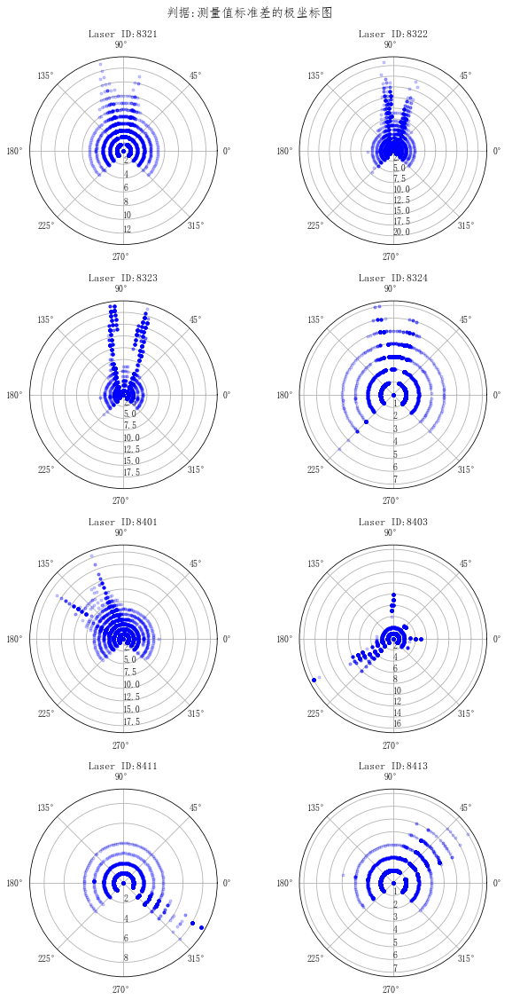

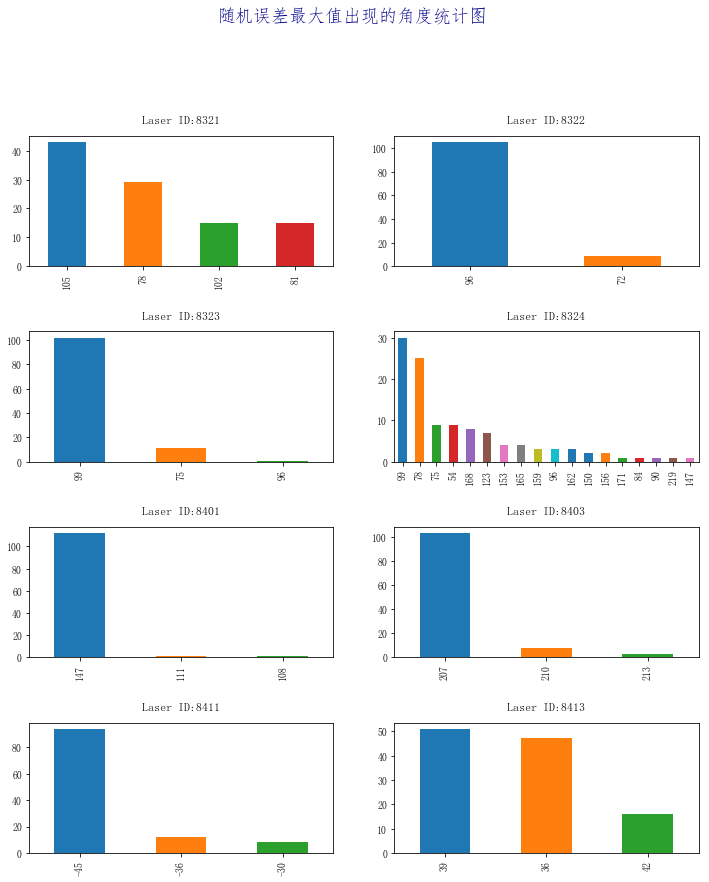

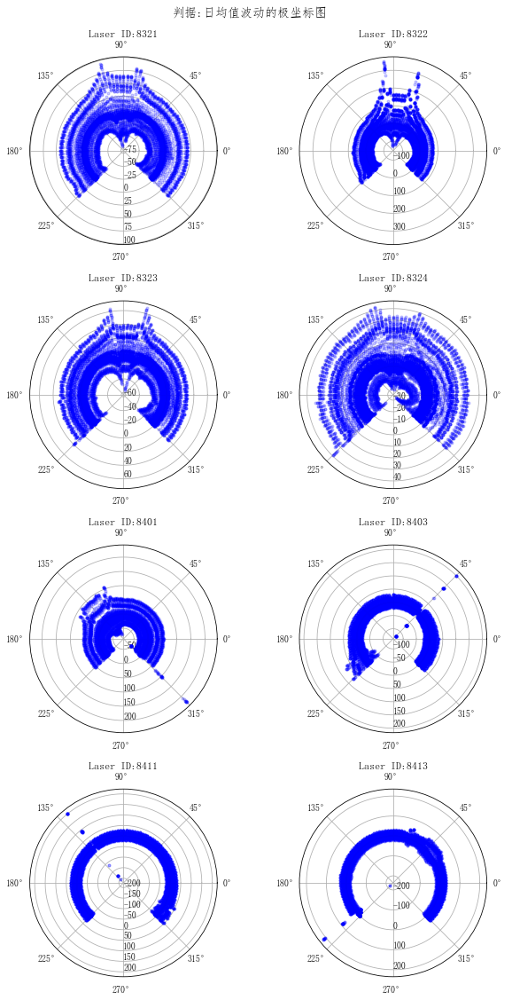

In [130]:
'''
db='10.1.1.202:3306-TEST'
time_info='ALL'
para='MO,TR'
analyze_object='L,8411,8413'
'''
#获取txt参数
import os
path=os.getcwd()
with open(path+'\\'+'sys_para.txt','r') as f1:
    sys_para=f1.read()
sys_para_list=sys_para.split(';')
db = sys_para_list[0]
time_info=sys_para_list[3]
para=sys_para_list[1]
analyze_object=sys_para_list[2]
#解析原始数据
data,data_day=get_all_data(db,time_info)
data = data[~data.label.isna()].reset_index(drop=True)
# 对应列名和突变标识
d = data.columns[np.r_[3:8,12:23,29:31]]
df_label = data.label.str.split(' ',expand=True)
df_label.columns=['L'+str(x) for x in list(range(18))]

data = pd.concat([data,df_label],axis=1)
la = df_label.columns.values
label_dic={}
for i in range(len(la)):
    label_dic[d[i]]=la[i]

server_list = data.server_id.unique()
num_server = len(server_list)
laser_list = sorted(data.laser_id.unique())
num_laser = len(laser_list)
col_list1=['prop_0.1','prop_0.2','prop_0.3','prop_0.3more']
name1 = [dic['prop_0.1'][0],dic['prop_0.2'][0],dic['prop_0.3'][0],dic['prop_0.3more'][0]]
name2=[dic['measure_5'][0],dic['measure_10'][0],dic['measure_15'][0],dic['measure_15more'][0],]
col_list2=['measure_5','measure_10','measure_15','measure_15more']
n = 91*3
a = -45
b = a+n
angle1 = np.arange(a,b,3)
angle = [math.radians(a) for a in angle1]#弧度

def final_result1(data,para,analyze_object):
    ###提取判据指标信息，list
    if ',' in para:
        para_list=para.split(',')
    else:
        para_list=[para]
    '''
    if 'MO' not in para_list:
        timeline_MO=''
    elif 'ST' not in para_list:
        timeline_hour,timeline_day,timeline_max_daily_variation,timeline_std,timeline_measure,timeline_rand,timeline_error_band=['']*7
    elif ('MO' not in para_list)&('ST' not in para_list):
    '''
    timeline_MO,timeline_hour,timeline_day,timeline_max_daily_variation,timeline_std,timeline_measure,timeline_rand,timeline_error_band=['']*8
    for pa in para_list:
        if pa=='VC':
            result_VC(data,analyze_object)
        elif pa=='MO':
            timeline_MO=result_MO(data,analyze_object)
        elif pa=='TR':
            result_TR(data,analyze_object)
        else:
            timeline_hour,timeline_day,timeline_max_daily_variation,timeline_std,timeline_measure,timeline_rand,timeline_error_band=result_ST(data,analyze_object) 
    return timeline_MO,timeline_hour,timeline_day,timeline_max_daily_variation,timeline_std,timeline_measure,timeline_rand,timeline_error_band

timeline_MO,timeline_hour,timeline_day,timeline_max_daily_variation,timeline_std,timeline_measure,timeline_rand,timeline_error_band=final_result1(data,para,analyze_object)

In [131]:
def return_timeline(timeline1):
    if timeline1!='':
        return timeline1
return_timeline(timeline_MO)

In [132]:
return_timeline(timeline_hour)

In [121]:
return_timeline(timeline_day)

In [122]:
return_timeline(timeline_max_daily_variation)

In [123]:
return_timeline(timeline_std)

In [124]:
return_timeline(timeline_measure)

In [125]:
return_timeline(timeline_rand)

In [126]:
return_timeline(timeline_error_band)

In [127]:
'''
#data为截取了时间信息的数据，para为判据组名，analyze_object为分析对象
def final_result(data,para,analyze_object):
    ###提取判据指标信息，list
    if ',' in para:
        para_list=para.split(',')
    else:
        para_list=[para]
    if 'VC' in para_list:
        print("\033[1;31m\t{}\033[0m\n".format('电压电流特性：'))
        if analyze_object=='ALL':
            for argu in para_dic['VC']:
                argument_plot_no_threshold(data,argu)
        elif 'L' in analyze_object:
            laser_input=analyze_object.split(',')[1:]
            df=data[data['laser_id'].isin(laser_input)]
            for argu in para_dic['VC']:
                argument_plot_no_threshold(df,argu)  
        else:
            server_input=analyze_object.split(',')[1:]
            df=data[data['server_id'].isin(server_input)]
            for argu in para_dic['VC']:
                server_line_plot(df,argu,server_input)
        #a,b,c,d,e,f,g,h=''
        #return a,b,c,d,e,f,g,h
    #电机特性
    if 'MO' in para_list:
        print("\033[1;31m\t{}\033[0m".format('电机特性：'))
        if analyze_object=='ALL':
            argument_plot_no_threshold(data,'pwm')
            argument_plot_no_threshold(data,'avg_duration')
            time_line_MO=time_line_laser(data,'帧用时分布',name1,col_list1)
        elif 'L' in analyze_object:
            laser_input=analyze_object.split(',')[1:]
            df=data[data['laser_id'].isin(laser_input)]
            argument_plot_no_threshold(df,'pwm')
            argument_plot_no_threshold(df,'avg_duration')
            time_line_MO=time_line_laser(df,'帧用时分布',name1,col_list1)
        else:
            server_input=analyze_object.split(',')[1:]
            df=data[data['server_id'].isin(server_input)]
            server_line_plot(df,'pwm',server_input)
            server_line_plot(df,'avg_duration',server_input)
            time_line_MO=time_line_laser(df,'帧用时分布',name1,col_list1)
            #time_line_MO.render()
        #a,b,c,d,e,f,g,h=''
        return time_line_MO#,a,b,c,d,e,f,g,h
    if 'TR' in para_list:
        print("\033[1;31m\t{}\033[0m".format('传输接口特性：'))
        if analyze_object=='ALL':
            for argu in para_dic['TR']:
                argument_plot_no_threshold(data,argu)
        elif 'L' in analyze_object:
            laser_input=analyze_object.split(',')[1:]
            df=data[data['laser_id'].isin(laser_input)]
            for argu in para_dic['TR']:
                argument_plot_no_threshold(df,argu)  
        else:
            server_input=analyze_object.split(',')[1:]
            df=data[data['server_id'].isin(server_input)]
            for argu in para_dic['TR']:
                server_line_plot(df,argu,server_input)
        #a,b,c,d,e,f,g,h=''
        #return a,b,c,d,e,f,g,h
    if 'ST' in para_list:
        print("\033[1;31m\t{}\033[0m".format('统计特性：'))
        if analyze_object=='ALL':
            #print("\033[1;31m\t{}\033[0m".format('产品趋势性指标：'))
            #小时均值最大最小值
            mean_hour = get_measure_data(data,'mean_hour')
            max_hour = get_measure_data(data,'max_hour')
            min_hour = get_measure_data(data,'min_hour')
            #mean_max_min_line(mean_hour,max_hour,min_hour,judge=['小时','小时历史趋势图'])
            timeline_hour=mean_max_min_line(mean_hour,max_hour,min_hour,judge=['小时','小时历史趋势图'])
        
            py_polar_hour(data,'mean_hour')
            #日均值最大最小值
            
            mean_day = get_daily_measure_data(data_day,'mean_day')
            max_day = get_daily_measure_data(data_day,'max_day')
            min_day = get_daily_measure_data(data_day,'min_day')
            timeline_day = mean_max_min_line(mean_day,max_day,min_day,['日','历史趋势图'])
            
            #print("\033[1;31m\t{}\033[0m".format('产品离散度指标：'))
            #polar(data,'max_daily_variation')
            #time_line_laser_multi_angle(data,'max_daily_variation')
            
            timeline_max_daily_variation=time_line_laser_multi_angle(data,'max_daily_variation')
            polar(data,'std')
            #time_line_laser_multi_angle(data,'std')
            
            timeline_std=time_line_laser_multi_angle(data,'std')
            measure_5 = get_measure_data(data,'measure_5')
            measure_10 = get_measure_data(data,'measure_10')
            measure_15 = get_measure_data(data,'measure_15')
            measure_15more = get_measure_data(data,'measure_15more')
            #time_area_measure_multi_angle(data,measure_5,measure_10,measure_15,measure_15more,judge='测量值分布图')#judge=['小时'，'历史趋势图']
            
            timeline_measure=time_area_measure_multi_angle(data,measure_5,measure_10,measure_15,measure_15more,judge='测量值分布图')#judge=['小时'，'历史趋势图']           
            bar_plot(data)
            #print("\033[1;31m\t{}\033[0m".format('产品误差指标：'))
            #polar(data,'rand_err_trimed')
            #time_line_laser_multi_angle(data,'rand_err_trimed')
            
            timeline_rand = time_line_laser_multi_angle(data,'rand_err_trimed')
            polar(data,'daily_mean_variation')
            timeline_mean_diff=time_line_laser_multi_angle(data,'daily_mean_variation')
            timeline_error_band=time_area_error_multi_angle(data,'误差上下界')
        elif 'L' in analyze_object:
            laser_input=analyze_object.split(',')[1:]
            data_L=data[data['laser_id'].isin(laser_input)]
            data_day_L=data_day[data_day['laser_id'].isin(laser_input)]
            #print("\033[1;31m\t{}\033[0m".format('产品趋势性指标：'))
            #小时均值最大最小值
            mean_hour = get_measure_data(data_L,'mean_hour')
            max_hour = get_measure_data(data_L,'max_hour')
            min_hour = get_measure_data(data_L,'min_hour')
            #mean_max_min_line(mean_hour,max_hour,min_hour,judge=['小时','小时历史趋势图'])
            timeline_hour=mean_max_min_line(mean_hour,max_hour,min_hour,judge=['小时','小时历史趋势图'])
        
            py_polar_hour(data_L,'mean_hour')
            
            #日均值最大最小值
            mean_day = get_daily_measure_data(data_day_L,'mean_day')
            max_day = get_daily_measure_data(data_day_L,'max_day')
            min_day = get_daily_measure_data(data_day_L,'min_day')
            timeline_day = mean_max_min_line(mean_day,max_day,min_day,['日','历史趋势图'])
            
            #print("\033[1;31m\t{}\033[0m".format('产品离散度指标：'))
            #polar(data,'max_daily_variation')
            #time_line_laser_multi_angle(data,'max_daily_variation')
            
            timeline_max_daily_variation=time_line_laser_multi_angle(data_L,'max_daily_variation')
            polar1(data_L,'std')
            #time_line_laser_multi_angle(data,'std')
            
            timeline_std=time_line_laser_multi_angle(data_L,'std')
            measure_5 = get_measure_data(data_L,'measure_5')
            measure_10 = get_measure_data(data_L,'measure_10')
            measure_15 = get_measure_data(data_L,'measure_15')
            measure_15more = get_measure_data(data_L,'measure_15more')
            #time_area_measure_multi_angle(data,measure_5,measure_10,measure_15,measure_15more,judge='测量值分布图')#judge=['小时'，'历史趋势图']
            
            timeline_measure=time_area_measure_multi_angle(data_L,measure_5,measure_10,measure_15,measure_15more,judge='测量值分布图')#judge=['小时'，'历史趋势图']           
            bar_plot1(data_L)
            #print("\033[1;31m\t{}\033[0m".format('产品误差指标：'))
            #polar(data,'rand_err_trimed')
            #time_line_laser_multi_angle(data,'rand_err_trimed')
            
            timeline_rand = time_line_laser_multi_angle(data_L,'rand_err_trimed')
            polar1(data_L,'daily_mean_variation')
            timeline_mean_diff=time_line_laser_multi_angle(data_L,'daily_mean_variation')
            timeline_error_band=time_area_error_multi_angle(data_L,'误差上下界')
        else:
            server_input=analyze_object.split(',')[1:]
            data_S=data[data['server_id'].isin(server_input)]
            data_day_S=data_day[data_day['laser_id'].isin(laser_input)]
            #print("\033[1;31m\t{}\033[0m".format('产品趋势性指标：'))
            #小时均值最大最小值
            mean_hour = get_measure_data(data_S,'mean_hour')
            max_hour = get_measure_data(data_S,'max_hour')
            min_hour = get_measure_data(data_S,'min_hour')
            #mean_max_min_line(mean_hour,max_hour,min_hour,judge=['小时','小时历史趋势图'])
            timeline_hour=mean_max_min_line(mean_hour,max_hour,min_hour,judge=['小时','小时历史趋势图'])
        
            py_polar_hour(data_S,'mean_hour')
            
            #日均值最大最小值
            mean_day = get_daily_measure_data(data_day_S,'mean_day')
            max_day = get_daily_measure_data(data_day_S,'max_day')
            min_day = get_daily_measure_data(data_day_S,'min_day')
            timeline_day = mean_max_min_line(mean_day,max_day,min_day,['日','历史趋势图'])
            
            #print("\033[1;31m\t{}\033[0m".format('产品离散度指标：'))
            #polar(data,'max_daily_variation')
            #time_line_laser_multi_angle(data,'max_daily_variation')
            
            timeline_max_daily_variation=time_line_laser_multi_angle(data_S,'max_daily_variation')
            polar1(data_S,'std')
            #time_line_laser_multi_angle(data,'std')
            
            timeline_std=time_line_laser_multi_angle(data_S,'std')
            measure_5 = get_measure_data(data_S,'measure_5')
            measure_10 = get_measure_data(data_S,'measure_10')
            measure_15 = get_measure_data(data_S,'measure_15')
            measure_15more = get_measure_data(data_S,'measure_15more')
            #time_area_measure_multi_angle(data,measure_5,measure_10,measure_15,measure_15more,judge='测量值分布图')#judge=['小时'，'历史趋势图']
            
            timeline_measure=time_area_measure_multi_angle(data_S,measure_5,measure_10,measure_15,measure_15more,judge='测量值分布图')#judge=['小时'，'历史趋势图']           
            bar_plot(data_S)
            #print("\033[1;31m\t{}\033[0m".format('产品误差指标：'))
            #polar(data,'rand_err_trimed')
            #time_line_laser_multi_angle(data,'rand_err_trimed')
            
            timeline_rand = time_line_laser_multi_angle(data_S,'rand_err_trimed')
            polar1(data_S,'daily_mean_variation')
            timeline_mean_diff=time_line_laser_multi_angle(data_S,'daily_mean_variation')
            timeline_error_band=time_area_error_multi_angle(data_S,'误差上下界')
        return timeline_hour,timeline_day,timeline_max_daily_variation,timeline_std,timeline_measure,timeline_rand,timeline_error_band#,timeline_mean_diff
''';

In [128]:
'''
from IPython.display import Javascript
#para=sys.argv[2]
#analyze_object=sys.argv[3]
para='VC,MO,TR'
analyze_object='ALL'
timeline_hour,timeline_day,timeline_max_daily_variation,timeline_std,timeline_measure,timeline_rand,timeline_error_band=['']*7

if 'ST' not in para:
    final_result(data,para,analyze_object)
    Javascript('IPython.notebook.execute_cells_below()')
else:
    timeline_hour,timeline_day,timeline_max_daily_variation,timeline_std,timeline_measure,timeline_rand,timeline_error_band=final_result(data,para,analyze_object)
    Javascript('IPython.notebook.execute_cells_below()')
''';

In [129]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')